# COSC 3P99 Computer Science Project: Augmenting Your Notes with Graph Auto Encoders

Name: Elias Switzer

Student #: 7419997

Notebook 2

## Outline and Goal

This half of my COSC 3P99 project is roughly based on the [medium article](https://medium.com/stanford-cs224w/augmenting-your-notes-using-graph-neural-networks-e61f0898033a) titled "Augmenting Your Notes Using Graph Neural Networks".

To summarize, the goal is to design and train a model on Wikipedia data so that we can predict the top three related Wikipedia articles for any given input note (from our own notes, etc.).

The goal of this project will be to have a trained model that could be used for this goal.

## Link Prediction

As we saw in Notebook 1, node classification is a major problem addressed by graph neural neworks, and it is useful for inferring information about a node based on its relationship with other nodes in the graph.

However, what about cases where we don't have this relationship information, such as above, where our input notes won't have links to other nodes in the graph. We need a way to infer edges between nodes.

This introduces us to *link prediction*, also known as relation prediction, where we train a model on an incomplete set of edges. The goal is to use this partial information to infer the missing edges.

## GAE Architecture

Graph Auto Encoders are an architecture used for training models for link prediction problems. Auto encoders work in an unsupervised manner, meaning we do not need labelled data. It is used in applications where labelled data is not available.

The idea is that input goes into the encoder to get some embedding in the embedding/latent space, and then we try to reconstruct the input using the decoder. Since no labelled data is available, the input graph will be used as the labelled data as the model's loss (reconstruction) function aims to maximize the similarity between the decoded graph and the input graph. The model is trained on the difference between the original input and the reconstruction.<br/><br/>

![autoencoder](https://www.compthree.com/images/blog/ae/ae.png)<br/><br/>

While deep learning autoencoders can be applied to many different types of data, graph autoencoders (GAE) are used with graph data for link prediction.

The encoder for our GAE is a convolutional GNN that produces a low dimensional embedding representation (such as the one from Notebook 1). The embedding space is just the output of the GCN ($Z=\bar{X}$), and it can be defined by the following equations:<br/><br/>

$$\bar{X}=GCN(A,X)=ReLU(\tilde{A}XW_0)$$
- Where $A$ is the adjacency matrix of our graph and $X$ is the node features.
- ReLU is a non-linear activation function.<br/><br/>

$$\tilde{A}=D^{-1/2}AD^{-1/2}$$
- $\tilde{A}$ is the required normalization we apply to the adjacency matrix.<br/><br/>

The decoder is the inner product between latent variable $Z$ to reconstruct the adjacency matrix $A$. The reconstructed adjacency matrix, $\hat{A}$, is summarized in the follow equation:

$$\hat{A}=\text{logistic sigmoid function }(zz^{T})$$<br/><br/>

**Why are we using GAE for this project?**

Since we are trying to predict which Wikipedia articles (nodes) best connect to a given note, we have a link prediction problem. GAE is great for link prediction since links do not have labels. If we have a tensor representation of our note that we're making predictions for, we can encode it using our trained model and get the predictions.

### What is a VGAE?

VGAE, or variational graph autoencoders are a more complex version of the graph autoencoder architecture. Instead of moving the node embedding to a specific point in the latent space, we move it in a Multivariate Gaussian distribution. This means that we don't have the specific point in the latent space, but rather we have parameters $\mu$ and $\sigma^2$, and thus a particular range in the latent space.

VGAE can make our model more accurate, but for the purposes of this project, we will just stick to the simple GAE architecture.

## Performance Metrics AUC and AP

### AUC (Area Under the Curve)

Before we talk about AUC, we need to introduce the ROC, or *receiver operating characteristic* curve. The ROC curve is a graph showing the performance of a classification model at all classification thresholds.

In a binary classification, the ROC curve plots true positive classifications against false positive classifications.

The true and false positive rates are defined as the following:

$$TPR=\frac{TP}{TP+FN}$$

$$FPR=\frac{FP}{FP+TN}$$

AUC is simply the area underneath the ROC curve from (0,0) to (1,1).

### AP (Average Precision)

AP, or *average precision*, is another performance metric, similar to AUC.

AP is the area under the precision-recall curve, where precision and recall are defined as the following:

$$\text{Precision}=\frac{TP}{TP+FP}$$

$$\text{Recall}=\frac{TP}{TP+FN}$$

### Why are we using AUC and AP?

AUC and AP are regularly used as model test statistics for node classification because it is a binary classification. But why and how are they used here for a link prediction task?

Since performance of our model is based on whether it predicts that there is a link or not, we can separate that into a binary classification (positive or negative). Thus, in this case, AUC and AP are based on whether there is a link or not.

## Benchmark GAE Implementations

The benchmark GAE implementations are based on the code from: https://colab.research.google.com/github/AntonioLonga/PytorchGeometricTutorial/blob/main/Tutorial6/Tutorial6.ipynb#scrollTo=lx1XL1VqVoJZ

### Required Libraries and Helper Functions

In [ ]:
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)

#!pip install -q torch-scatter -f https://data.pyg.org/whl/torch-${TORCH}.html
#!pip install -q torch-sparse -f https://data.pyg.org/whl/torch-${TORCH}.html
#!pip install -q git+https://github.com/pyg-team/pytorch_geometric.git

!pip install torch_geometric
#!pip install torch_sparse
#!pip install torch_scatter

2.3.1+cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.2/64.2 kB 1.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 6.0 MB/s eta 0:00:00


In [ ]:
import torch
import torch_geometric.transforms as T
from torch_geometric.nn import GCNConv
from torch_geometric.utils import train_test_split_edges

In [ ]:
# Helper functions for visualization.
%matplotlib inline
import networkx as nx
import matplotlib.pyplot as plt


def visualize_graph(G, color):
    plt.figure(figsize=(7,7))
    plt.xticks([])
    plt.yticks([])
    nx.draw_networkx(G, pos=nx.spring_layout(G, seed=42), with_labels=False,
                     node_color=color, cmap="Set2")
    plt.show()


def visualize_embedding(h, color, epoch=None, auc=None, ap=None):
    plt.figure(figsize=(7,7))
    plt.xticks([])
    plt.yticks([])
    h = h.detach().cpu().numpy()
    plt.scatter(h[:, 0], h[:, 1], s=140, c=color, cmap="Set2")
    if epoch is not None and loss is not None:
        plt.xlabel(f'Epoch: {epoch}, AUC: {auc:.4f}, AP: {ap:.4f}', fontsize=16)
    plt.show()

### Cora (with explanation)

#### Import Dataset

First, as usual, we need to import our dataset. We will use the three Planetoid datasets as benchmarks for our GAE model. Notice that we normalize the features of the graph. This is important for our graph auto encoder architecture as we saw above.

In [ ]:
from torch_geometric.datasets import Planetoid
dataset = Planetoid(root="", name="Cora", transform=T.NormalizeFeatures())
print(dataset.data)

Data(x=[2708, 1433], edge_index=[2, 10556], y=[2708], train_mask=[2708], val_mask=[2708], test_mask=[2708])


#### Clear Training and Testing Masks

Since we are going to be generating randomized training, validation, and test splits for the edges, we can remove the ones the dataset has built in.

Printing the dataset, we can see that only have nodes, edges, and features.

In [ ]:
data = dataset[0]
data.train_mask = data.val_mask = data.test_mask = None
data

Data(x=[2708, 1433], edge_index=[2, 10556], y=[2708])

#### Split Edges

Next, we can use the PyTorch Geometric function, `train_test_split_edges` to use our edges and generate positive and negative training and testing splits.

In [ ]:
data = train_test_split_edges(data)
data

/usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'train_test_split_edges' is deprecated, use 'transforms.RandomLinkSplit' instead
  warnings.warn(out)


#### Create Encoder

Now let's create our encoder, which is identical to the GCN model we used in Notebook 1.

In [ ]:
class GCNEncoder(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(GCNEncoder, self).__init__()
        self.conv1 = GCNConv(in_channels, 2 * out_channels, cached=True)
        self.conv2 = GCNConv(2 * out_channels, out_channels, cached=True)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index).relu()
        return self.conv2(x, edge_index)

#### Finish GAE Architecture

This next step will also look somewhat familiar. We need to define the number of epochs and the optimizer. But what is the GAE function? And where do we define our loss function?

`GAE` is a PyTorch Geometric function that completes our graph autoencoder framework for us given our encoder. It will deal with the decoder for us, which is extremely helpful if we don't have any special specifications for the decoder.

Loss is calculated in the training step below, and we will use a special kind of loss, called reconstruction loss, which we will talk about in more detail later.

In [ ]:
from torch_geometric.nn import GAE

# parameters
out_channels = 2
num_features = dataset.num_features
epochs = 100

# model
model = GAE(GCNEncoder(num_features, out_channels))

# move to GPU (if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
x = data.x.to(device)
train_pos_edge_index = data.train_pos_edge_index.to(device)

# inizialize the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

#### Create Train and Test Functions

Let's define our training and testing functions.

For our training step, we:
1. Set the model to training mode using `model.train()`.
2. Zero the gradients.
3. Get the embeddings using the encoder, as we would with the model from Notebook 1.
4. Calculate the reconsturction loss based on the decoded embeddings compared to the training edges. `model.recon_loss()` does this for us and this is the loss value our model will train on.
5. Backpropagate, which will derive new gradients to update the model with.
6. Use the optimizer and the new gradients to update the model.

For our testing step, we:
1. Set the model to evaluation mode using `model.eval()`
2. Get the embeddings using the encoder
3. Test those embeddings using `model.test`. We pass the positive and negative edges to this function, and it will return the test statistics.


In [ ]:
def train():
    model.train()
    optimizer.zero_grad()
    z = model.encode(x, train_pos_edge_index)
    loss = model.recon_loss(z, train_pos_edge_index)
    loss.backward()
    optimizer.step()
    return z, float(loss)


def test(pos_edge_index, neg_edge_index):
    model.eval()
    with torch.no_grad():
        z = model.encode(x, train_pos_edge_index)
    return model.test(z, pos_edge_index, neg_edge_index)

#### Train Model

Lastly, let's put the train and test functions into use and train the model.

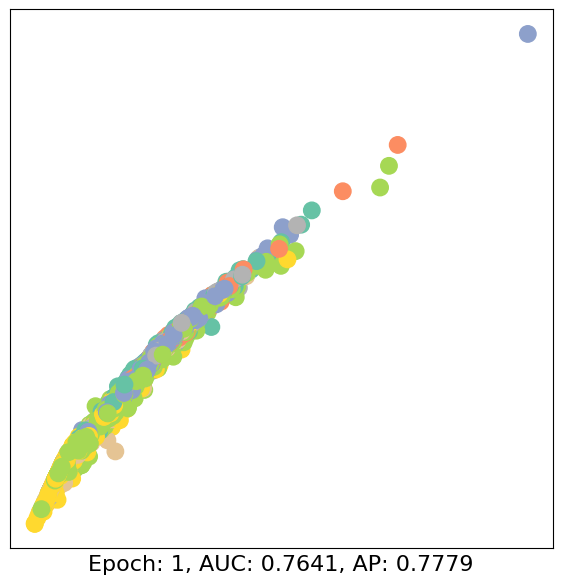

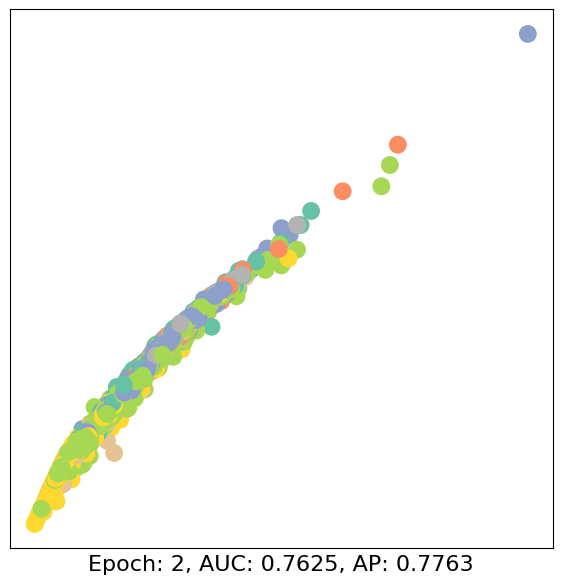

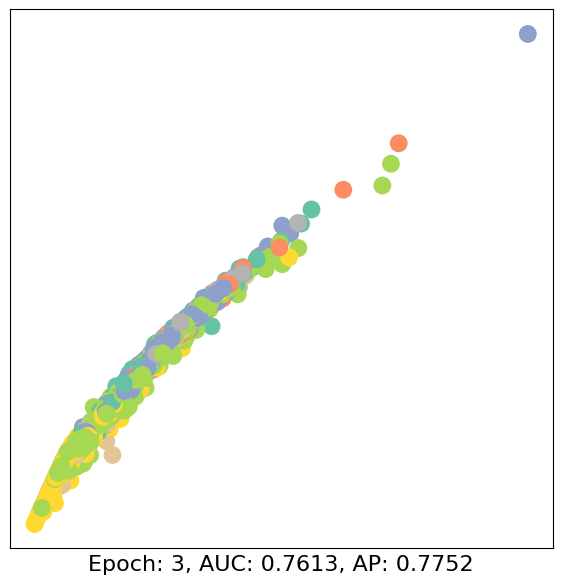

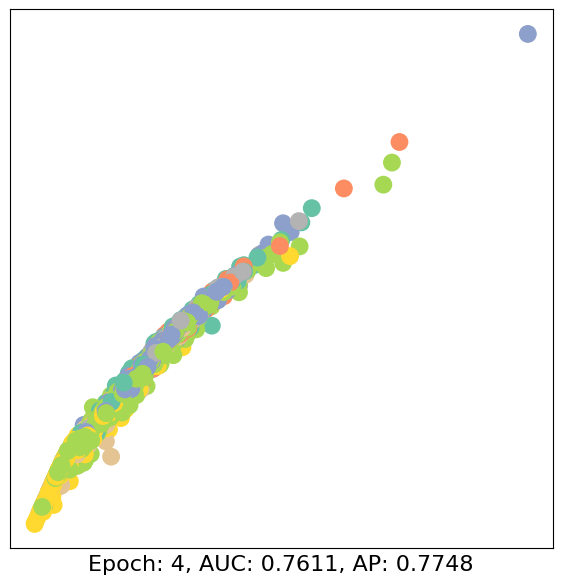

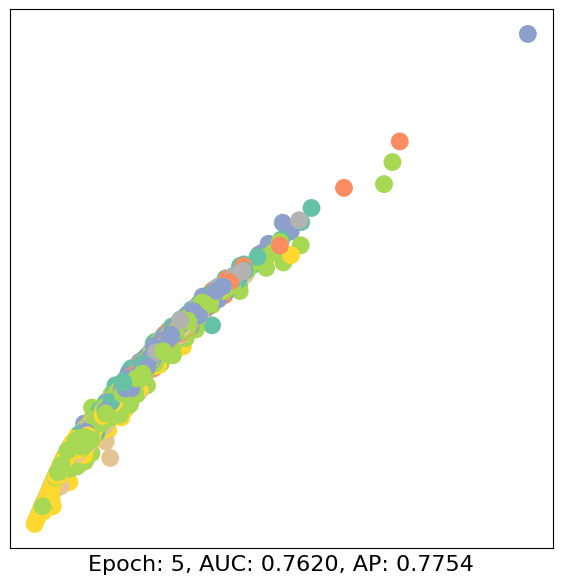

...

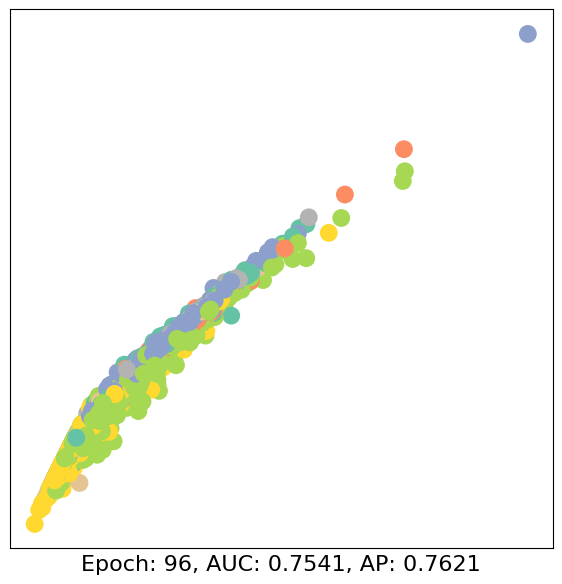

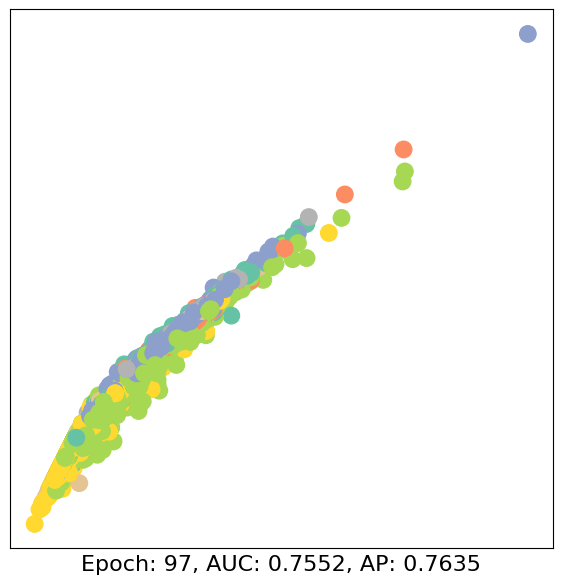

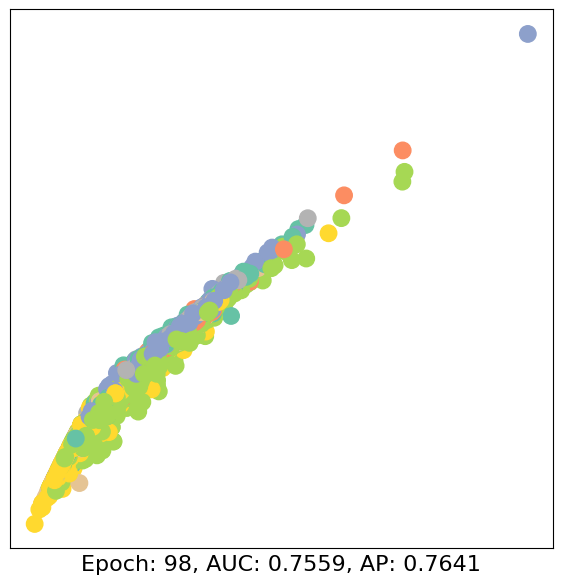

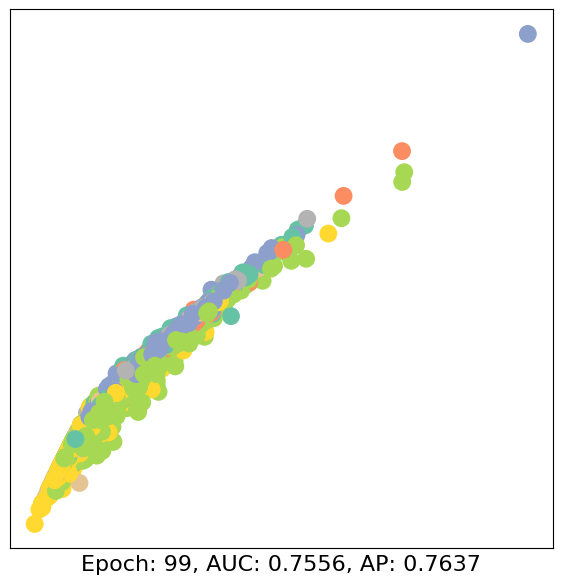

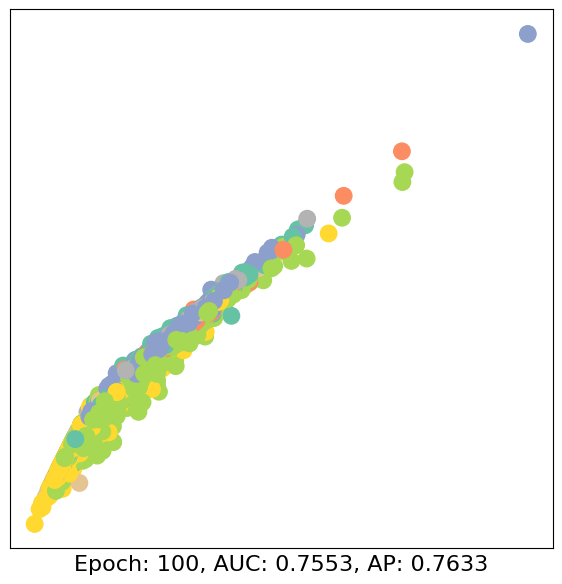

In [ ]:
for epoch in range(1, epochs + 1):
    z, loss = train()

    auc, ap = test(data.test_pos_edge_index, data.test_neg_edge_index)
    visualize_embedding(z, color=data.y, epoch=epoch, auc=auc, ap=ap)

### CiteSeer

In [ ]:
from torch_geometric.datasets import Planetoid
dataset = Planetoid(root="", name="CiteSeer", transform=T.NormalizeFeatures())
print(dataset.data)

Processing...


Data(x=[3327, 3703], edge_index=[2, 9104], y=[3327], train_mask=[3327], val_mask=[3327], test_mask=[3327])


Done!
/usr/local/lib/python3.10/dist-packages/torch_geometric/data/in_memory_dataset.py:300: UserWarning: It is not recommended to directly access the internal storage format `data` of an 'InMemoryDataset'. If you are absolutely certain what you are doing, access the internal storage via `InMemoryDataset._data` instead to suppress this warning. Alternatively, you can access stacked individual attributes of every graph via `dataset.{attr_name}`.
  warnings.warn(msg)


In [ ]:
data = dataset[0]
data.train_mask = data.val_mask = data.test_mask = None
data

Data(x=[3327, 3703], edge_index=[2, 9104], y=[3327])

In [ ]:
data = train_test_split_edges(data)

/usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'train_test_split_edges' is deprecated, use 'transforms.RandomLinkSplit' instead
  warnings.warn(out)


In [ ]:
data

Data(x=[3327, 3703], y=[3327], val_pos_edge_index=[2, 227], test_pos_edge_index=[2, 455], train_pos_edge_index=[2, 7740], train_neg_adj_mask=[3327, 3327], val_neg_edge_index=[2, 227], test_neg_edge_index=[2, 455])

In [ ]:
class GCNEncoder(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(GCNEncoder, self).__init__()
        self.conv1 = GCNConv(in_channels, 2 * out_channels, cached=True)
        self.conv2 = GCNConv(2 * out_channels, out_channels, cached=True)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index).relu()
        return self.conv2(x, edge_index)

In [ ]:
from torch_geometric.nn import GAE

# parameters
out_channels = 2
num_features = dataset.num_features
epochs = 100

# model
model = GAE(GCNEncoder(num_features, out_channels))

# move to GPU (if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
x = data.x.to(device)
train_pos_edge_index = data.train_pos_edge_index.to(device)

# inizialize the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

In [ ]:
def train():
    model.train()
    optimizer.zero_grad()
    z = model.encode(x, train_pos_edge_index)
    loss = model.recon_loss(z, train_pos_edge_index)
    loss.backward()
    optimizer.step()
    return z, float(loss)


def test(pos_edge_index, neg_edge_index):
    model.eval()
    with torch.no_grad():
        z = model.encode(x, train_pos_edge_index)
    return model.test(z, pos_edge_index, neg_edge_index)

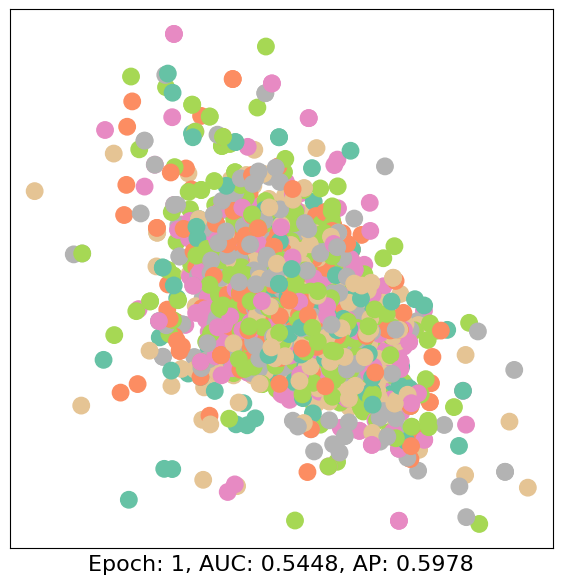

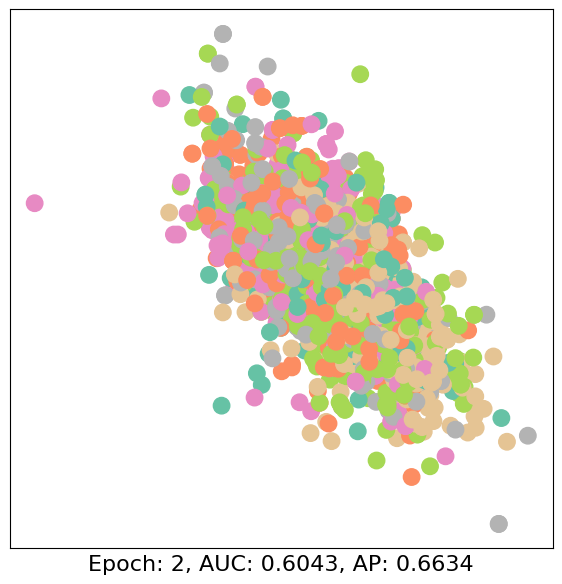

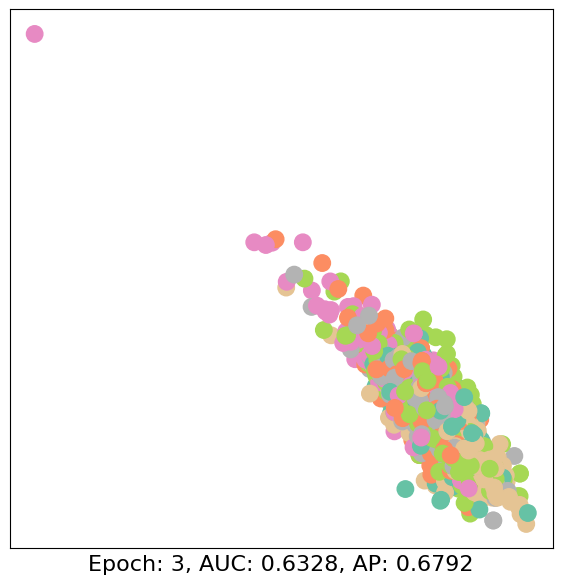

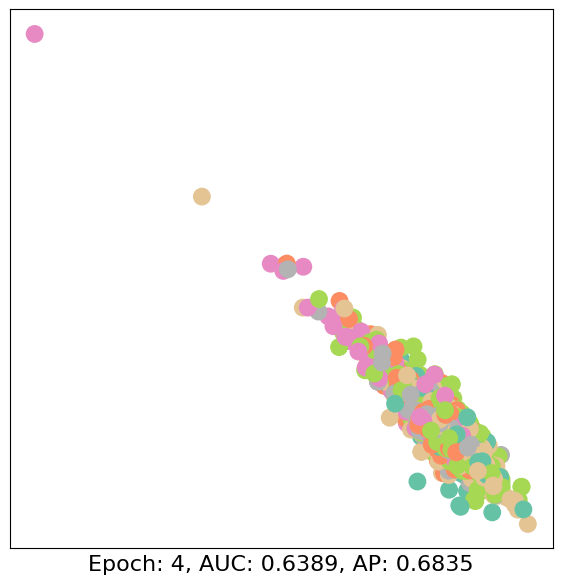

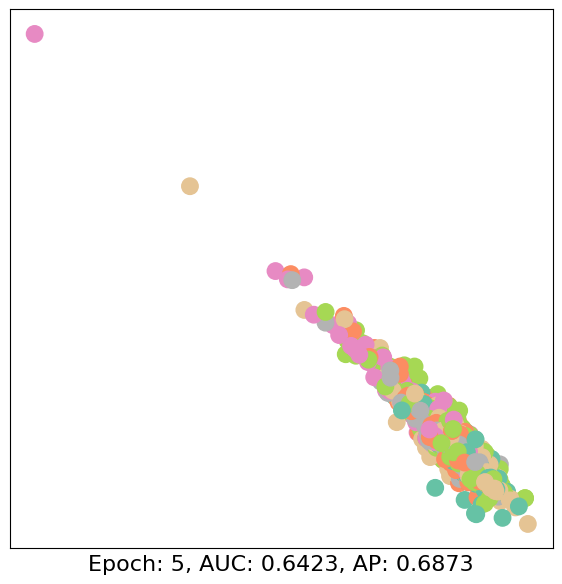

...

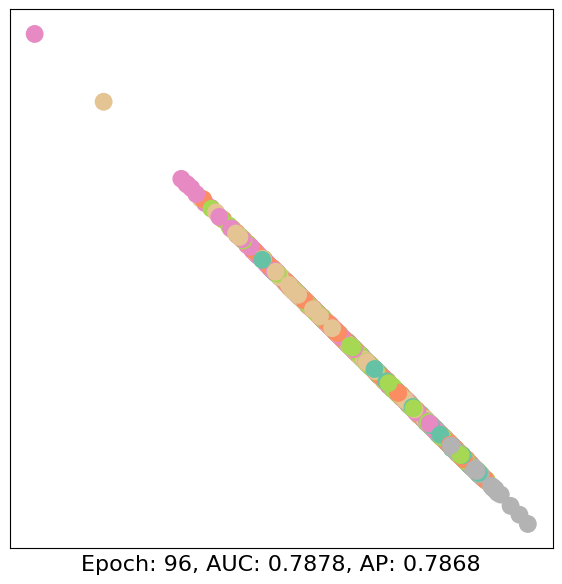

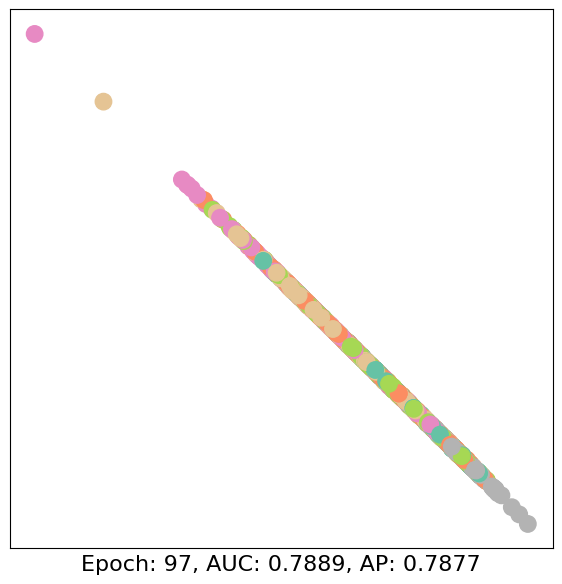

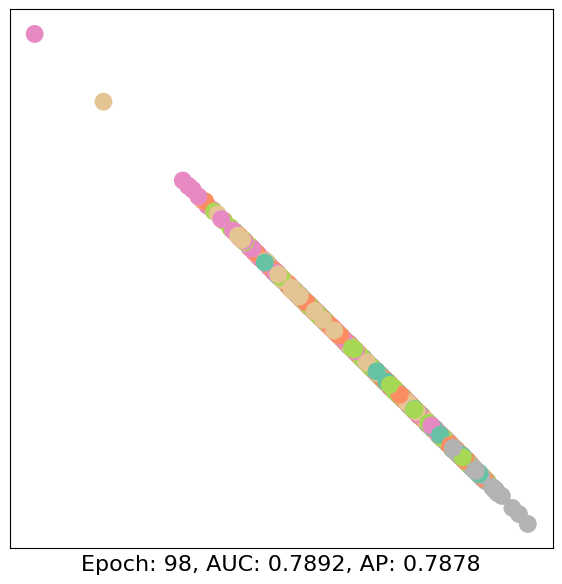

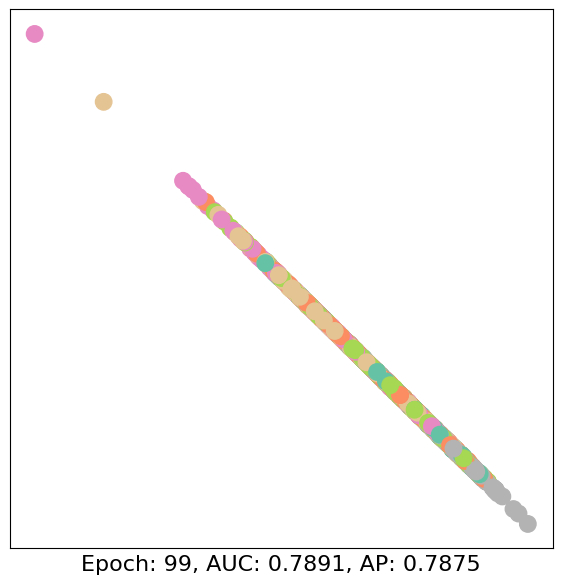

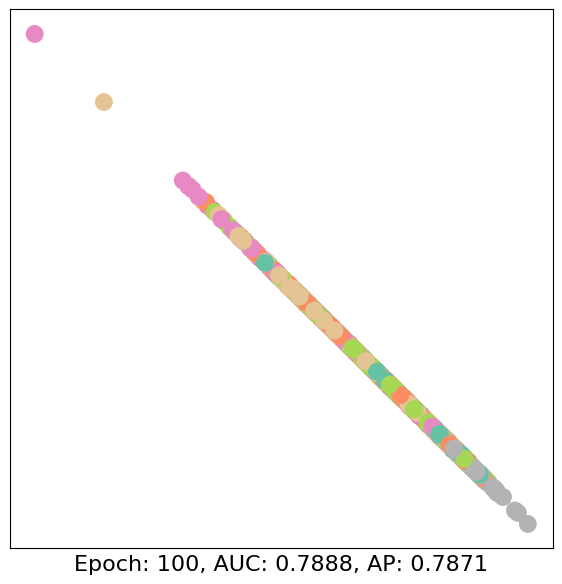

In [ ]:
for epoch in range(1, epochs + 1):
    z, loss = train()

    auc, ap = test(data.test_pos_edge_index, data.test_neg_edge_index)
    visualize_embedding(z, color=data.y, epoch=epoch, auc=auc, ap=ap)

### PubMed

In [ ]:
from torch_geometric.datasets import Planetoid
dataset = Planetoid(root="", name="PubMed", transform=T.NormalizeFeatures())
print(dataset.data)

Processing...


Data(x=[19717, 500], edge_index=[2, 88648], y=[19717], train_mask=[19717], val_mask=[19717], test_mask=[19717])


Done!
/usr/local/lib/python3.10/dist-packages/torch_geometric/data/in_memory_dataset.py:300: UserWarning: It is not recommended to directly access the internal storage format `data` of an 'InMemoryDataset'. If you are absolutely certain what you are doing, access the internal storage via `InMemoryDataset._data` instead to suppress this warning. Alternatively, you can access stacked individual attributes of every graph via `dataset.{attr_name}`.
  warnings.warn(msg)


In [ ]:
data = dataset[0]
data.train_mask = data.val_mask = data.test_mask = None
data

Data(x=[19717, 500], edge_index=[2, 88648], y=[19717])

In [ ]:
data = train_test_split_edges(data)

/usr/local/lib/python3.10/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'train_test_split_edges' is deprecated, use 'transforms.RandomLinkSplit' instead
  warnings.warn(out)


In [ ]:
data

Data(x=[19717, 500], y=[19717], val_pos_edge_index=[2, 2216], test_pos_edge_index=[2, 4432], train_pos_edge_index=[2, 75352], train_neg_adj_mask=[19717, 19717], val_neg_edge_index=[2, 2216], test_neg_edge_index=[2, 4432])

In [ ]:
class GCNEncoder(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(GCNEncoder, self).__init__()
        self.conv1 = GCNConv(in_channels, 2 * out_channels, cached=True)
        self.conv2 = GCNConv(2 * out_channels, out_channels, cached=True)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index).relu()
        return self.conv2(x, edge_index)

In [ ]:
from torch_geometric.nn import GAE

# parameters
out_channels = 2
num_features = dataset.num_features
epochs = 100

# model
model = GAE(GCNEncoder(num_features, out_channels))

# move to GPU (if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
x = data.x.to(device)
train_pos_edge_index = data.train_pos_edge_index.to(device)

# inizialize the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

In [ ]:
def train():
    model.train()
    optimizer.zero_grad()
    z = model.encode(x, train_pos_edge_index)
    loss = model.recon_loss(z, train_pos_edge_index)
    loss.backward()
    optimizer.step()
    return z, float(loss)


def test(pos_edge_index, neg_edge_index):
    model.eval()
    with torch.no_grad():
        z = model.encode(x, train_pos_edge_index)
    return model.test(z, pos_edge_index, neg_edge_index)

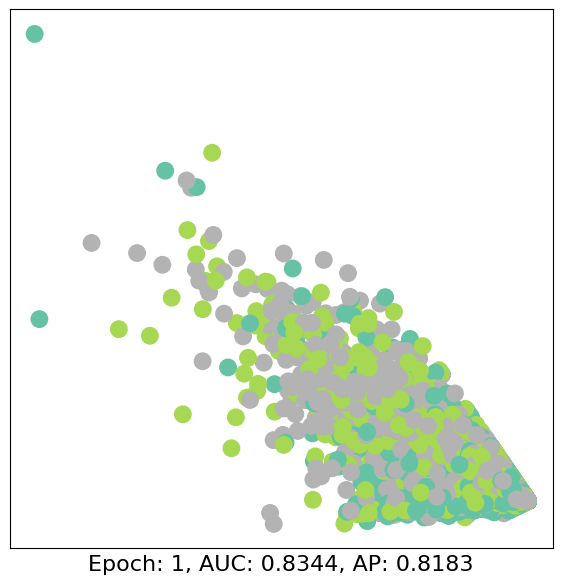

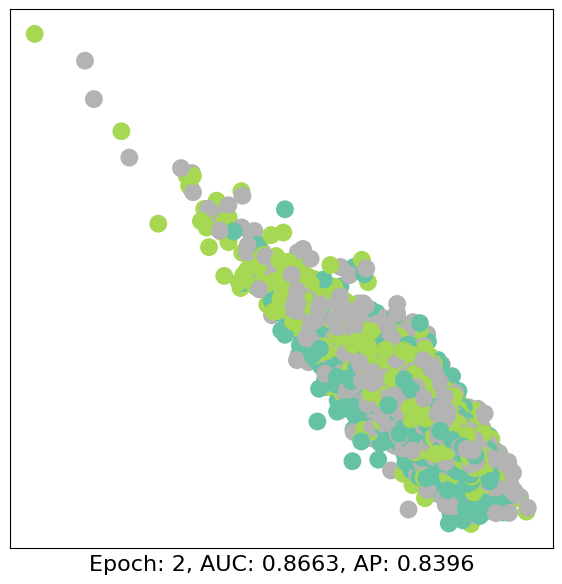

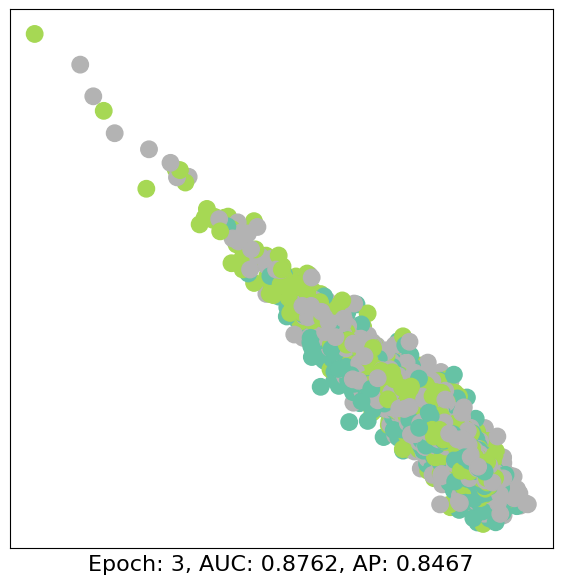

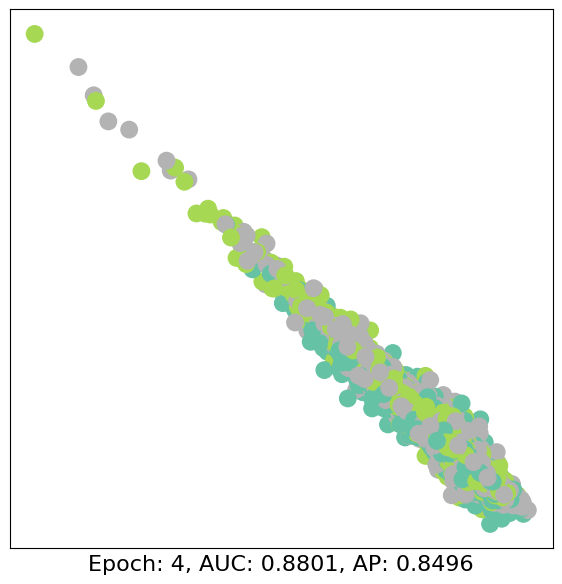

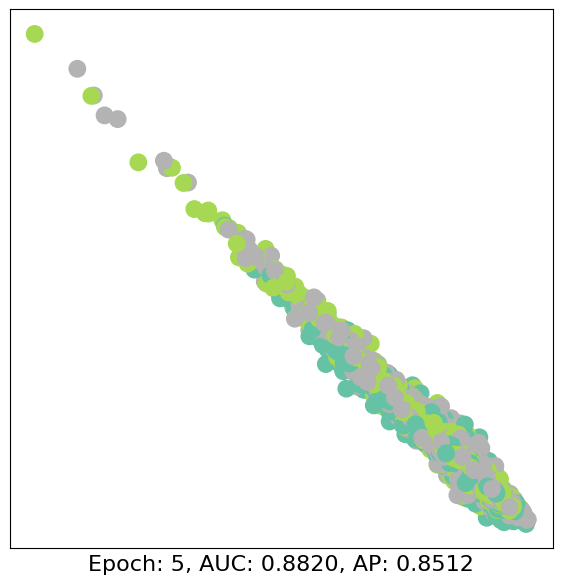

...

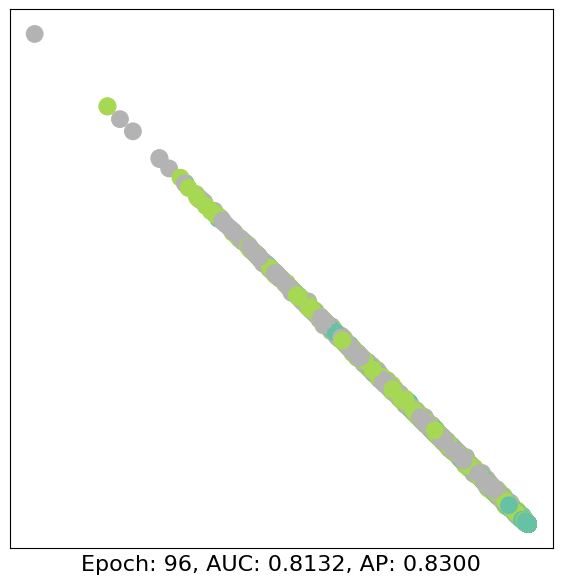

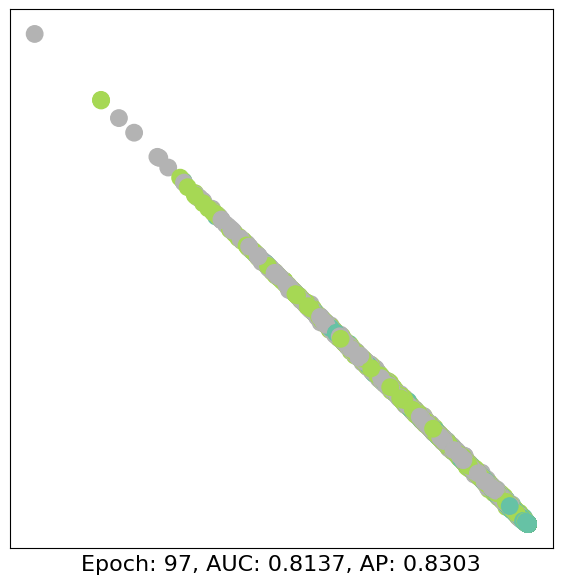

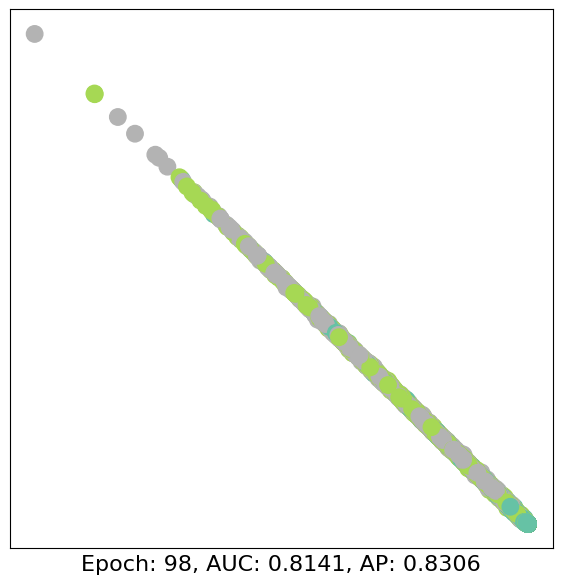

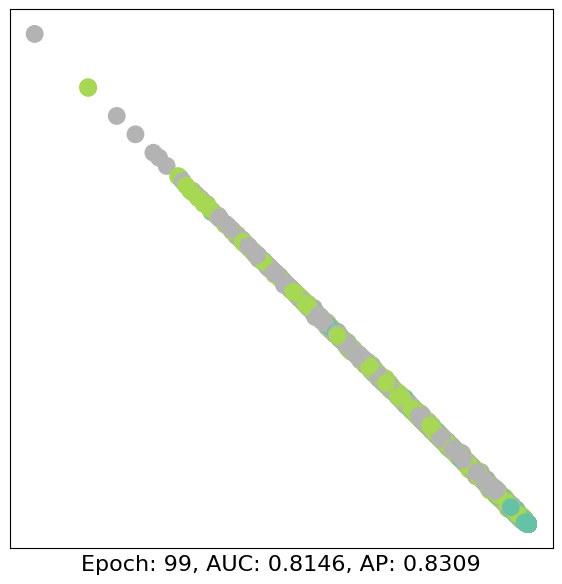

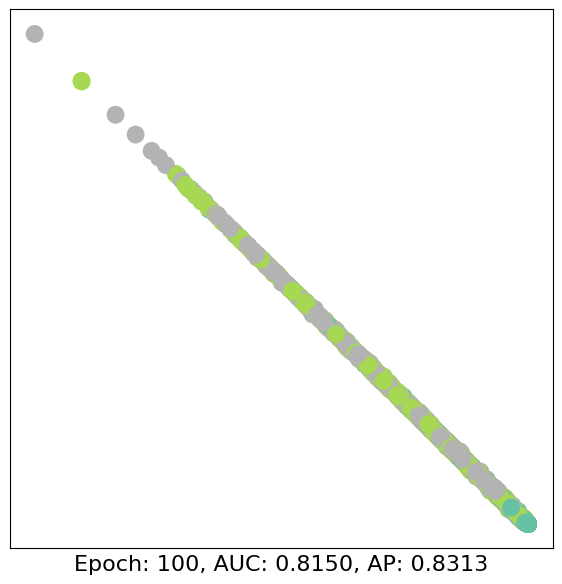

In [ ]:
for epoch in range(1, epochs + 1):
    z, loss = train()

    auc, ap = test(data.test_pos_edge_index, data.test_neg_edge_index)
    visualize_embedding(z, color=data.y, epoch=epoch, auc=auc, ap=ap)

### Benchmark Summary

The final AUC and AP performance metrics for the Cora, CiteSeer, and PubMed datasets after 100 epochs are summarized in the table below.

| Dataset | AUC | AP |
|--|--|--|
| Cora | 0.7553 | 0.7633 |
| CiteSeer | 0.7888 | 0.7871 |
| PubMed | 0.8150 | 0.8313 |

It's important to keep in mind that at some point during training, some of the models had better performance. To ensure that we get the best performance out of our models, it might be worth looking into an early-stopping condition that will end training after the model starts performing worse over a set of epochs or once the model reaches a desired performance level.

## Reconstruction Loss

As seen in the benchmark examples above, we use a loss function called `recon_loss()`. What is this loss function and how does it differ from loss functions we've already used (`BinaryCrossEntropy()`)?

When using graph autoencoders, we measure loss as the difference between the original input into the encoder and the output of the decoder. It's called reconstruction loss because we attempt to reconstruct the input using the autoencoder/decoder.

Reconstruction loss is not actually different from binary cross entropy loss. In fact, BCE can be used as a type of reconstruction loss, since it is binary. Other common loss functions for reconstruction are MSE (mean squared error) and L1Loss.

The reason we don't need to explicitly define the reconstruction loss function is because PyTorch's `GAE` class handles that for us. The code for recon loss can be found in the PyTorch Geometric GitHub repo: https://github.com/pyg-team/pytorch_geometric/blob/master/torch_geometric/nn/models/autoencoder.py

## WikiCS Dataset

The dataset we will be using for the model is WikiCS, since it is Wikipedia-based. Wiki CS is a smaller Wikipedia dataset comprised of only computer science related notes. For the purposes of faster training and testing, using a smaller dataset is helpful rather than using the entirety of Wikipedia.

The nodes in the WikiCS dataset each represent a given Wikipedia article while the edges represent the hyperlinks between them. The node features were derived from the text of the articles using word embeddings.

Here is some important information about the dataset:

| # of Classes | # of Nodes | # of Edges | # of Features |
|--|--|--|--|
| 10 | 11701 | 216123 | 300 |

Some of the classes include computation linguistics, databases, operating systems, and computer security.

What's also interesting is that there is 20 built-in training splits. We will try training the model once with a randomized training split and once with one of the built-in splits.

[Documentation for the WikiCS Dataset](https://pytorch-geometric.readthedocs.io/en/latest/generated/torch_geometric.datasets.WikiCS.html)

## WikiCS GAE Implementations

Now let's test our GAE architecture and model on the WikiCS Dataset. We will also be making a few adjustments to the model as explained below. Note that these adjustments will be doing essentially the same things as above.

### Required Libraries and Helper Functions

In [ ]:
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)

#!pip install -q torch-scatter -f https://data.pyg.org/whl/torch-${TORCH}.html
#!pip install -q torch-sparse -f https://data.pyg.org/whl/torch-${TORCH}.html
#!pip install -q git+https://github.com/pyg-team/pytorch_geometric.git

!pip install torch_geometric
#!pip install torch_sparse
#!pip install torch_scatter

2.3.1+cu121


In [ ]:
import torch
import torch_geometric.transforms as T
from torch_geometric.nn import GCNConv
from torch_geometric.utils import negative_sampling
from torch_geometric.datasets import WikiCS

In [ ]:
# Helper functions for visualization.
%matplotlib inline
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

def visualize_embedding(h, color, epoch=None, loss=None, val=None, test=None):
    plt.figure(figsize=(7,7))
    plt.xticks([])
    plt.yticks([])
    h = h.detach().cpu().numpy()
    plt.scatter(h[:, 0], h[:, 1], s=140, c=color, cmap="Set2")
    if epoch is not None and loss is not None:
        plt.xlabel(f'Epoch: {epoch}, Loss: {loss:.4f}, Val: {val:.4f}, Test: {test:.4f}', fontsize=16)
    plt.show()

### Randomized Training Split

The following code is based on this code example: https://github.com/pyg-team/pytorch_geometric/blob/master/examples/link_pred.py

#### Transform Dataset

Our first change to the above model is that we will define a dataset transform that includes `transforms.RandomLinkSplit`. This function is the replacement for the deprecated `train_test_split_edges` and it is much more powerful. By changing this, however, we also now define the decoder and its training logic ourselves, but this is not necessary.

In [ ]:
transform = T.Compose([
    T.NormalizeFeatures(),
    T.RandomLinkSplit(num_val=0.05, num_test=0.1, add_negative_train_samples=False)
])

Here we just specify the dataset as usual, which is WikiCS in this case. We also pass in the transform we created above.

In [ ]:
dataset = WikiCS("\..", transform=transform, is_undirected=False)
print(dataset.data)

Data(x=[11701, 300], edge_index=[2, 297110], y=[11701], train_mask=[11701, 20], val_mask=[11701, 20], test_mask=[11701], stopping_mask=[11701, 20])


Now let's get the training, validation and testing data from the dataset.

In [ ]:
train_data, val_data, test_data = dataset[0]

#### Create Graph Auto Encoder

Here we create our entire graph auto encoder class. This is different from our benchmark test where we only created the encoder and completed the auto encoder using the built-in `GAE` function.

This time we also need to specify the `decode` function, which follows the decoder logic explained in the **GAE Architecture** section above.

The `decode_all` function is from the example this code is based on and won't be used here. It can be used for testing the model with actual data.

In [ ]:
class GAE(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GAE, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def encode(self, x, edge_index):
        x = self.conv1(x, edge_index).relu()
        return self.conv2(x, edge_index)

    def decode(self, z, edge_label_index):
      return (z[edge_label_index[0]] * z[edge_label_index[1]]).sum(dim=-1)

    def decode_all(self, z):
        prob_adj = z @ z.t()
        return (prob_adj > 0).nonzero(as_tuple=False).t()

#### Model and Parameters

Let's create our hyperparameters and define our model using the class we just created.

In [ ]:
# parameters
hidden_channels = 128
out_channels = 64
num_features = dataset.num_features
epochs = 100

# model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = GAE(dataset.num_features, hidden_channels, out_channels).to(device)

# inizialize the optimizer and loss function
optimizer = torch.optim.Adam(params=model.parameters(), lr=0.01)
criterion = torch.nn.BCEWithLogitsLoss()

#### Create Train and Test Functions

These functions look a bit different as well. This is because we need to account for negative edge sampling that our `RandomLinkSplit` did not create. Furthermore, we account here for the decoder and use the decoded value as well as the original value (edge_label) to calculate the loss.

In [ ]:
def train():
    model.train()
    optimizer.zero_grad()
    z = model.encode(train_data.x, train_data.edge_index)

    # We perform a new round of negative sampling for every training epoch:
    neg_edge_index = negative_sampling(
        edge_index=train_data.edge_index, num_nodes=train_data.num_nodes,
        num_neg_samples=train_data.edge_label_index.size(1), method='sparse')

    edge_label_index = torch.cat(
        [train_data.edge_label_index, neg_edge_index],
        dim=-1,
    )
    edge_label = torch.cat([
        train_data.edge_label,
        train_data.edge_label.new_zeros(neg_edge_index.size(1))
    ], dim=0)

    out = model.decode(z, edge_label_index).view(-1)
    loss = criterion(out, edge_label)
    loss.backward()
    optimizer.step()
    return z, loss


@torch.no_grad()
def test(data):
    model.eval()
    z = model.encode(data.x, data.edge_index)
    out = model.decode(z, data.edge_label_index).view(-1).sigmoid()
    return roc_auc_score(data.edge_label.cpu().numpy(), out.cpu().numpy())

#### Train Model

Just like before, we are ready to put everything we have created to use to train and test the model.

The performance metrics (val and test) look different than before, but they are similar. Validation and test are both measures of area under the ROC curve, just like the AUC measurements from the pervious version of our model, but they are metrics based on different data splits.

The commented-out code can be used for stopping the model early if the model doesn't improve after a certain amount of epochs (patient value). The model will save the best iteration of itself (highest validation AUC value) and if there is no improvement to that best value after a certain number of epochs, those saved parameters will be used as the final model.

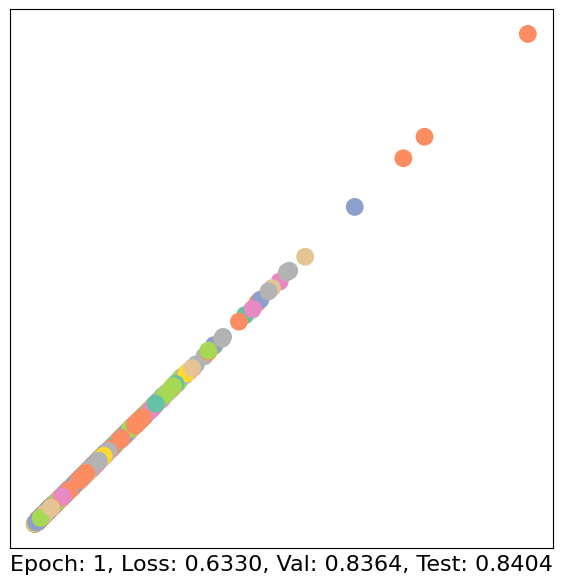

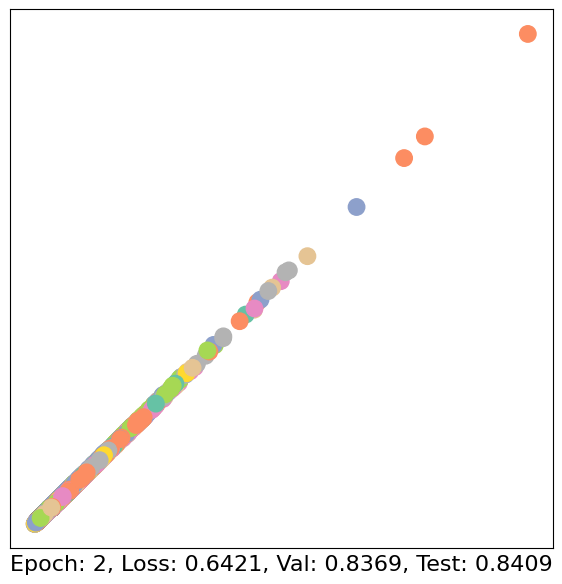

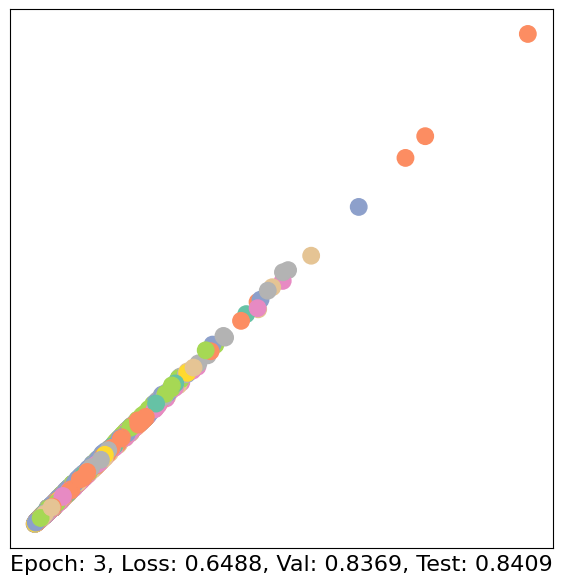

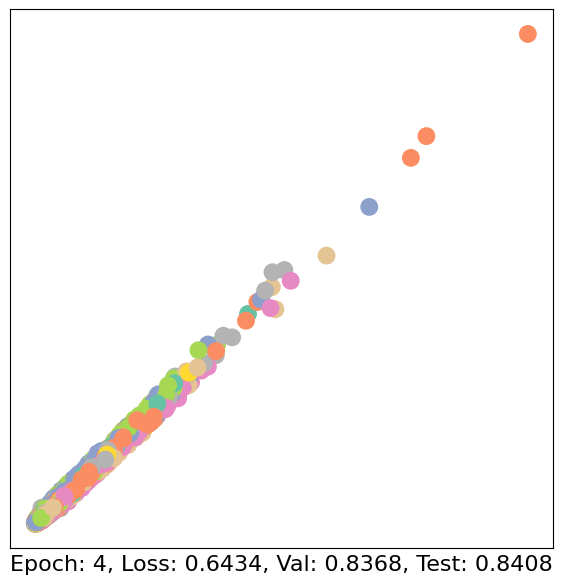

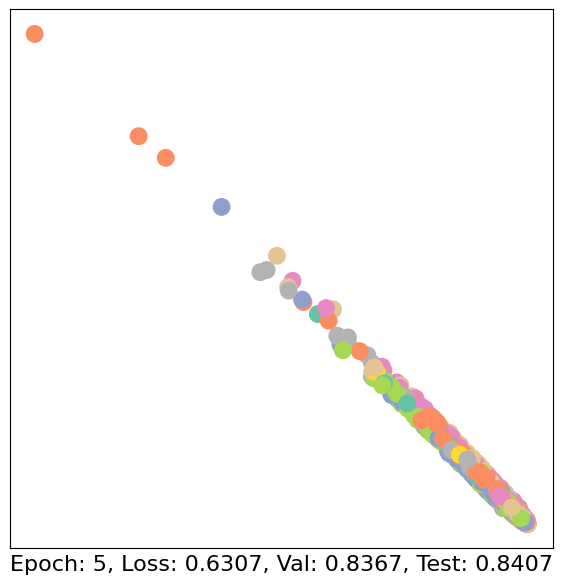

...

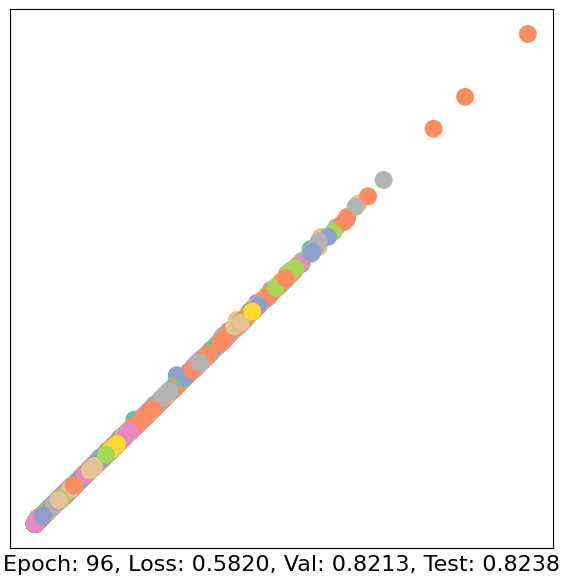

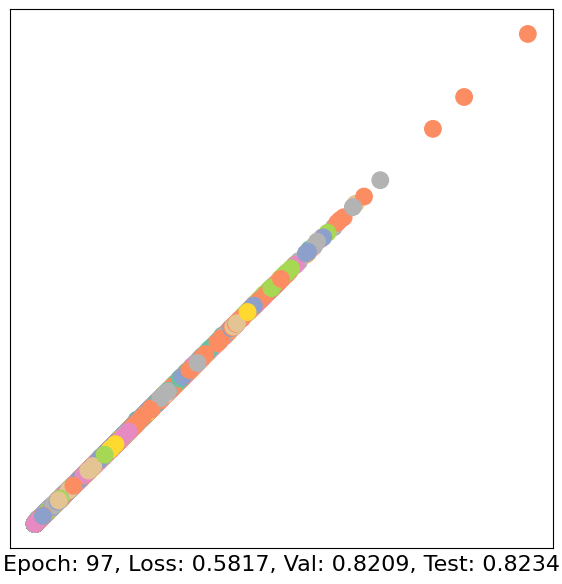

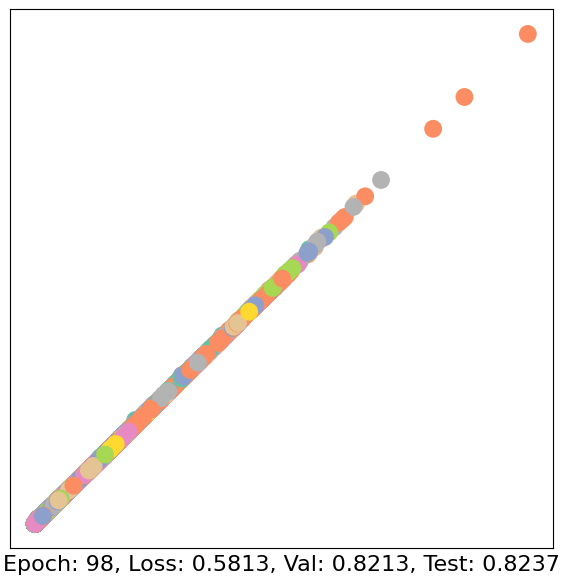

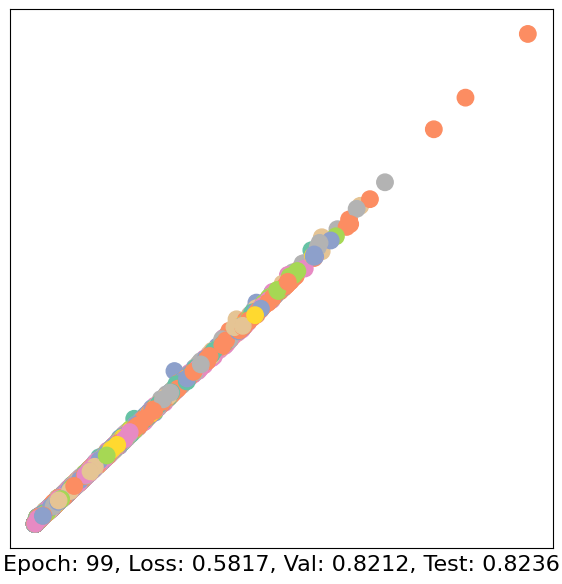

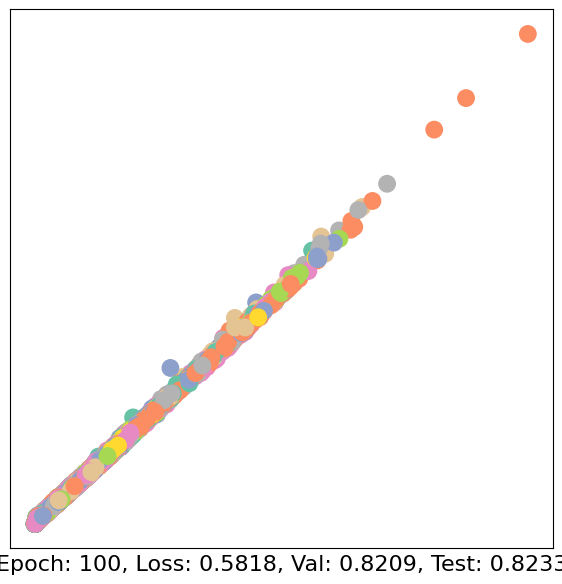

In [ ]:
# val_best_auc = 0
# improvement = 0
# patient = 20

for epoch in range(1, epochs + 1):
    z, loss = train()
    val_auc = test(val_data)

    # if val_auc > val_best_auc:
        # val_best_auc = val_auc
        # save_model(model, z, loss, val_auc)
        # improvement = 0
    # else:
        # improvement += 1

    # if improvement > patient:
        # print("Early stopping!")
        # break

    test_auc = test(test_data)
    visualize_embedding(z, color=train_data.y, epoch=epoch, loss=loss, val=val_auc, test=test_auc)



### Built-in Training Split

As it stands, the built-in training splits cannot be used for link prediction tasks, since `train_mask`, `val_mask`, and `test_mask` are for the nodes. This can be seen in the dimension of these masks, 11701, which is also the number of nodes in the dataset.

Since we need a training split for positive and negative edges, this cannot be used.

### Saving the Model

As a side-note, we can also save our trained model to be used later using `torch.save`. To do this in Google Colaboratory we need to mount our Google Drive.

In [ ]:
# save model
torch.save(model.state_dict(), '/content/drive/MyDrive/Colab Notebooks/Models/model.pt')

## Summary and Conclusions

Our final model performance metrics are summarized in the table below. Since we couldn't use the built-in splits, we only have one set of metrics.

| Model | Loss | Val AUC | Test AUC |
|-------|------|---------|----------|
|WikiCS Randomized|0.5818|0.8209|0.8233|


Fortunately, we can compare these metrics to the testing AUC metrics of our benchmarks as well. It is important to remember that the model slightly changed between the benchmarks and the WikiCS versions.

| Model | AUC |
|-------|-----|
|Cora| 0.7553 |
|CiteSeer| 0.7888 |
|PubMed| 0.8150 |
|WikiCS| 0.8233 |

It becomes clear that our new model is better than the old one, and/or the WikiCS dataset works better with our model (but it is likely the former).

On last consideration is what would be actually needed to have to make real predictions using our model in a way similar to the original Medium article? In the article, they created their own dataset using cleaned up Wikipedia data dumps. By doing this, they were able to control the way articles/notes were converted to vector/tensor form (they used Doc2Vec). Thus, to make a prediction using our own model, we would need to know the way the WikiCS dataset converted articles to tensor form (or create our own dataset).

## References

1. Dhupar, B., 2023. Loss Functions in Simple Autoencoders: MSE vs. L1 Loss. URL: https://medium.com/@bhipanshudhupar/loss-functions-in-simple-autoencoders-mse-vs-l1-loss-4e838ae425b9

2. Hamilton, W. L., 2020. Graph Representation Learning.

3. Karanam, A., 2023. Augmenting Your Notes Using Graph Neural Networks. URL: https://medium.com/stanford-cs224w/augmenting-your-notes-using-graph-neural-networks-e61f0898033a

4. Longa, A., 2021. PyTorch Geometric tutorial: Graph Autoencoders & Variational Graph Autoencoders. URL: https://www.youtube.com/watch?v=qA6U4nIK62E